In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from scipy.stats import skew, kurtosis
from scipy import stats


In [ ]:
# Load the dataset
file_players = "/content/players_data_light-2024_2025.csv"
df_players = pd.read_csv(file_players)

# Display basic info
df_players.info()
df_players.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2698 entries, 0 to 2697
Columns: 165 entries, Rk to AvgDist
dtypes: float64(61), int64(99), object(5)
memory usage: 3.4+ MB


,Rk,Player,Nation,Pos,Squad,Comp,Age,Born,MP,Starts,...,Att (GK),Thr,Launch%,AvgLen,Opp,Stp,Stp%,#OPA,#OPA/90,AvgDist
0,1,Max Aarons,eng ENG,DF,Bournemouth,eng Premier League,25.0,2000.0,3,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,Max Aarons,eng ENG,MF,Valencia,es La Liga,25.0,2000.0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Rodrigo Abajas,es ESP,DF,Valencia,es La Liga,21.0,2003.0,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,James Abankwah,ie IRL,"DF,MF",Udinese,it Serie A,21.0,2004.0,6,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,Keyliane Abdallah,fr FRA,FW,Marseille,fr Ligue 1,18.0,2006.0,1,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Select numerical columns
numerical_cols = df_players.select_dtypes(include=[np.number]).columns.tolist()
df_numerical = df_players[numerical_cols]


In [ ]:
# Impute missing values with median
imputer = SimpleImputer(strategy="median")
df_numerical_imputed = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)


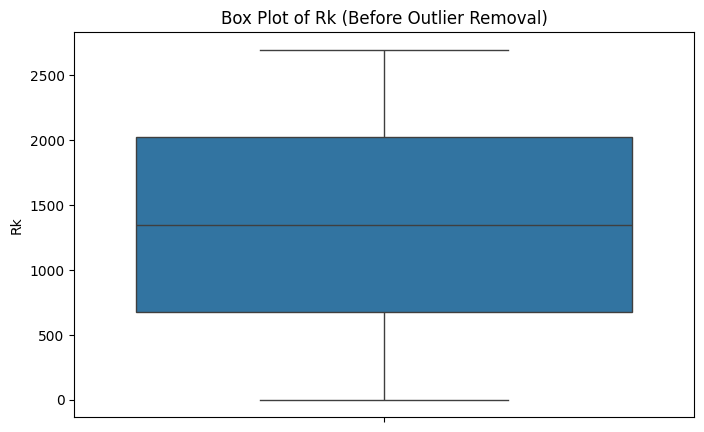

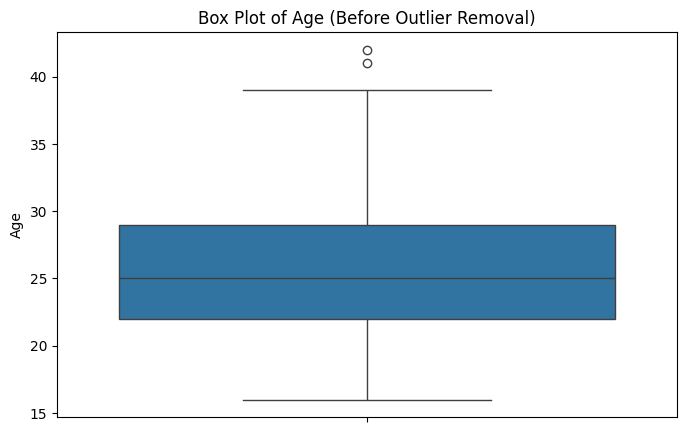

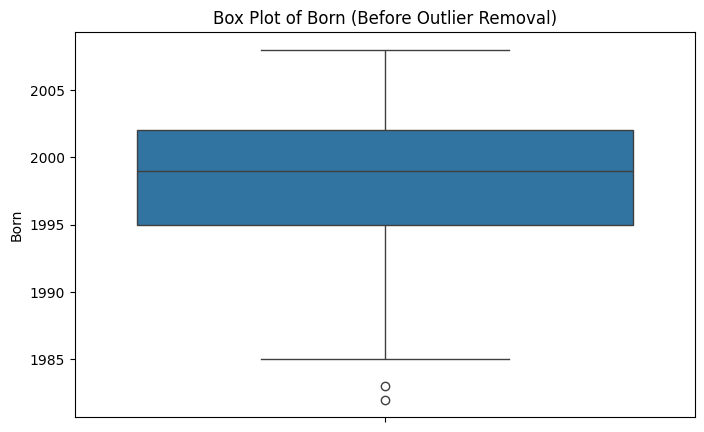

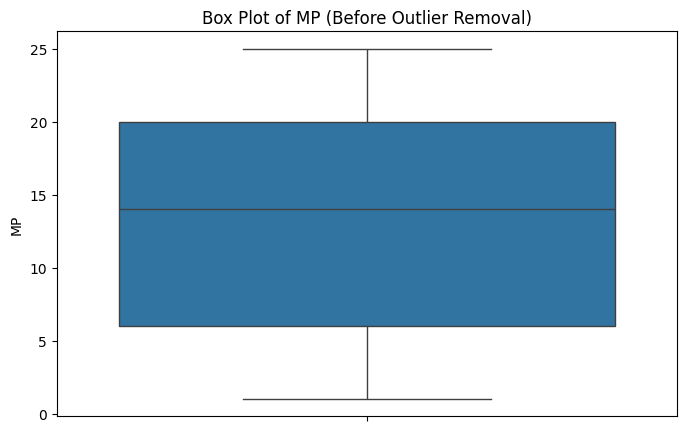

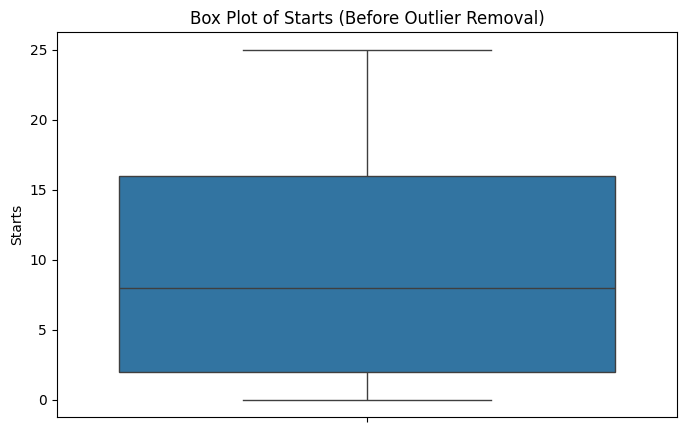

...

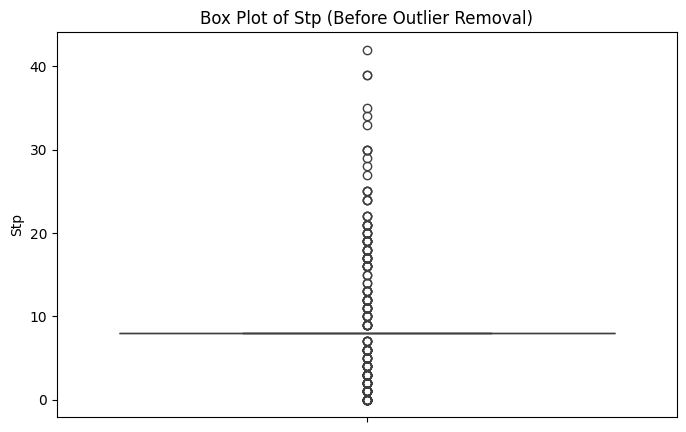

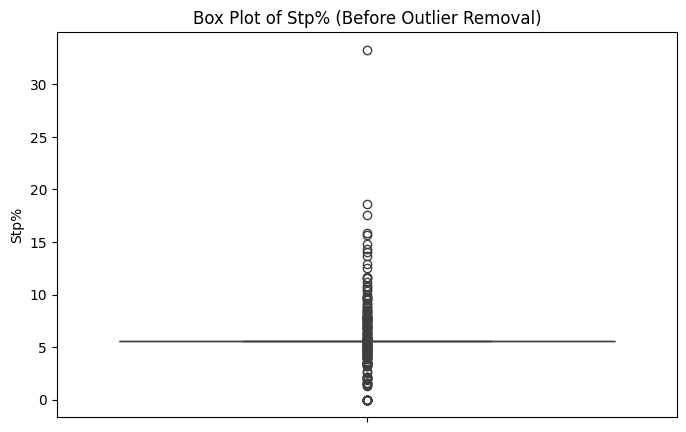

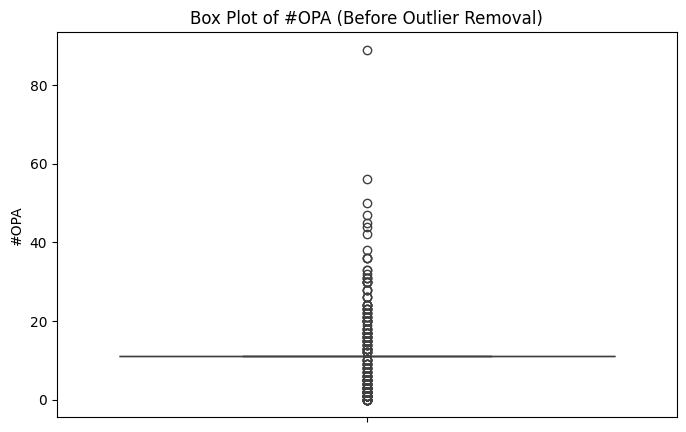

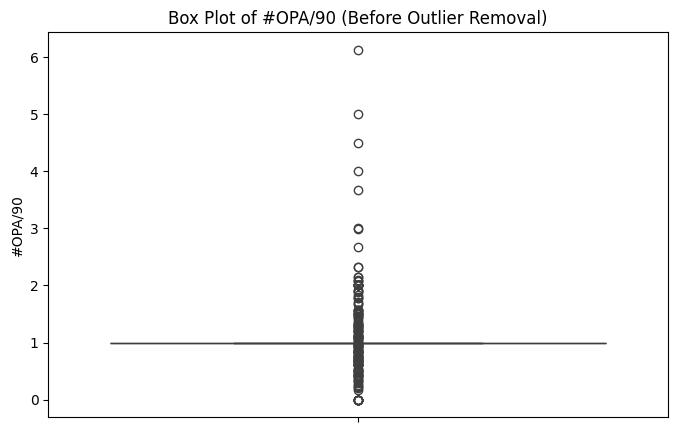

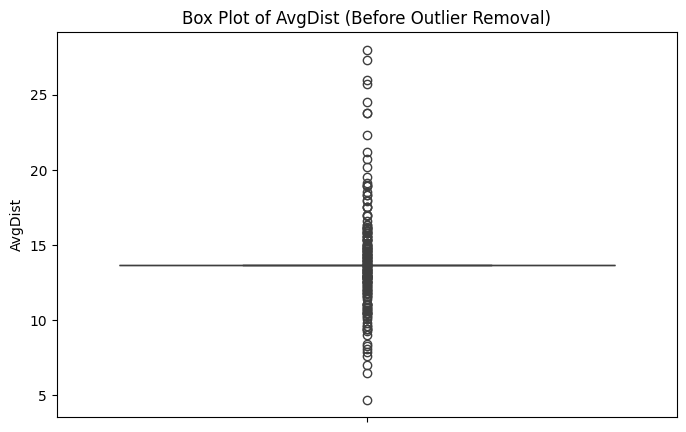

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through each numerical column and plot a separate box plot
for column in df_numerical_imputed.columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(y=df_numerical_imputed[column])
    plt.title(f"Box Plot of {column} (Before Outlier Removal)")
    plt.show()


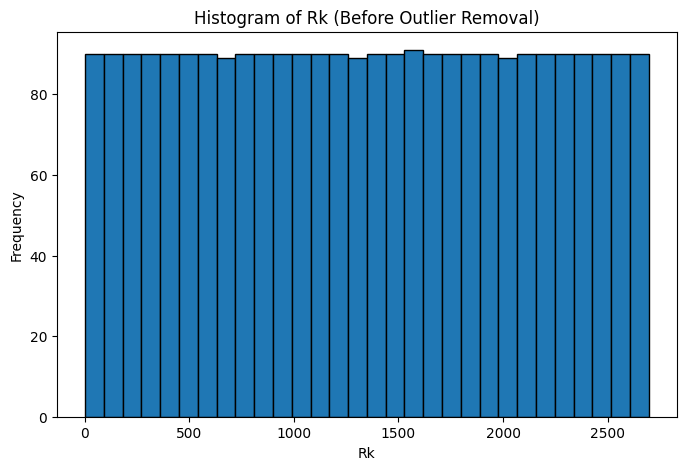

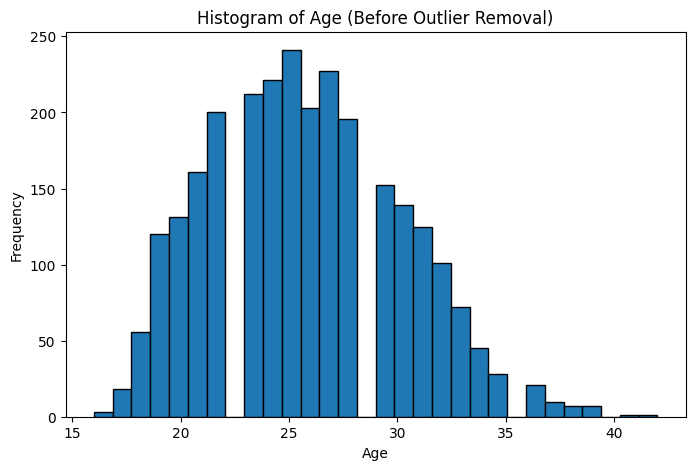

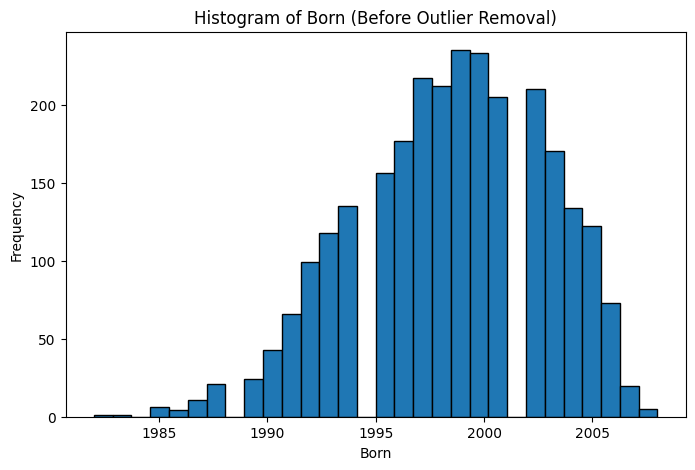

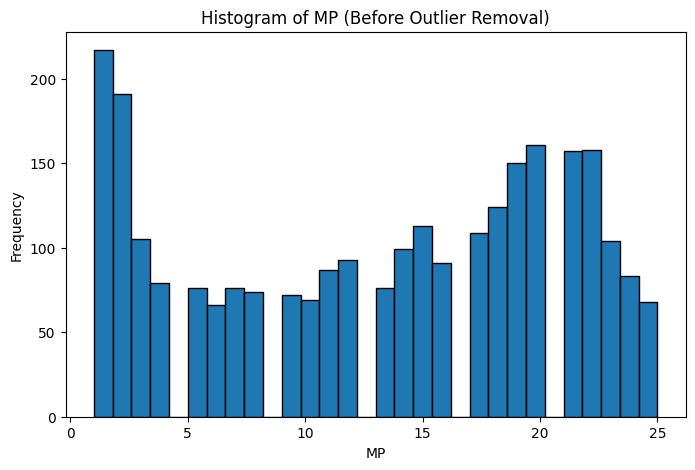

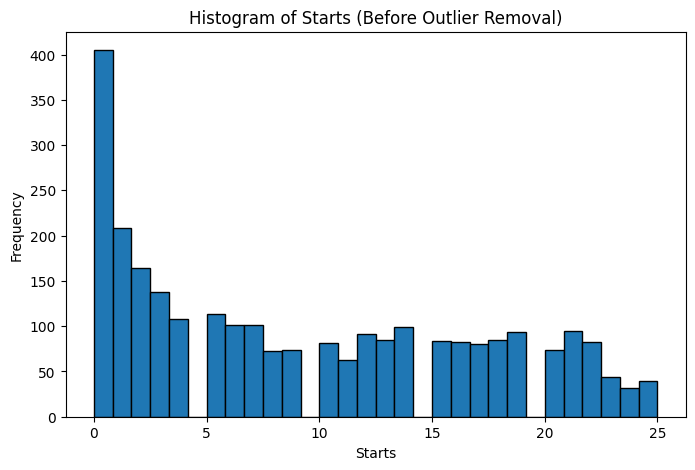

...

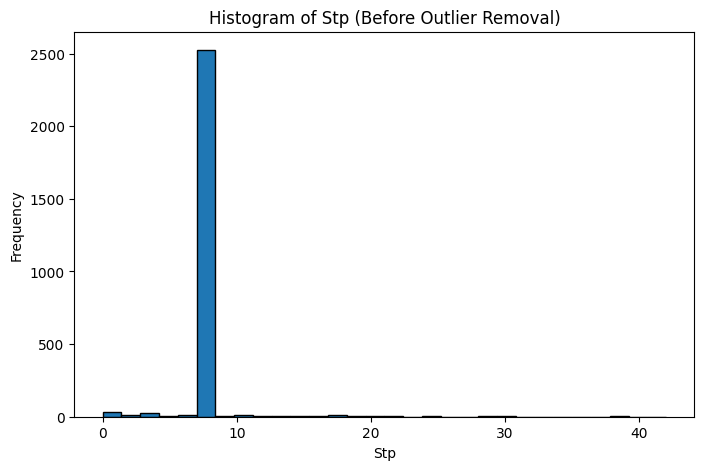

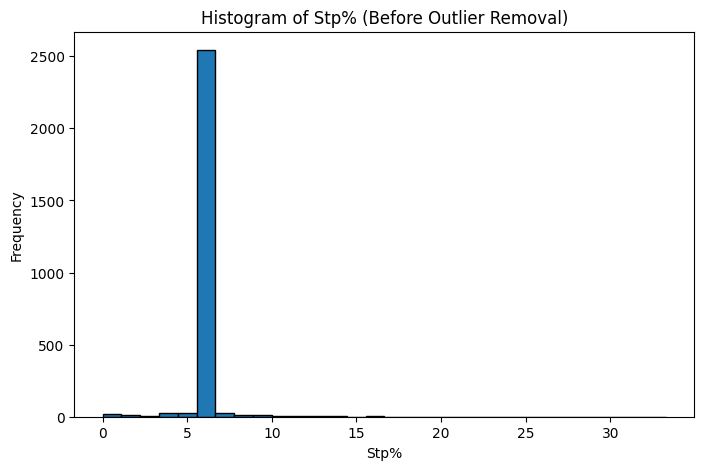

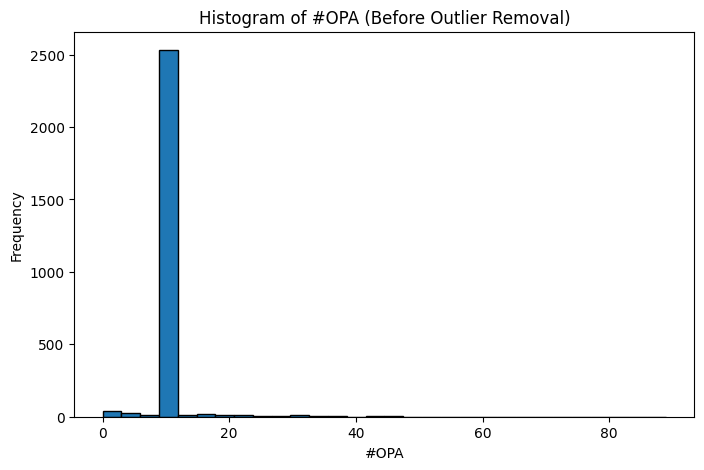

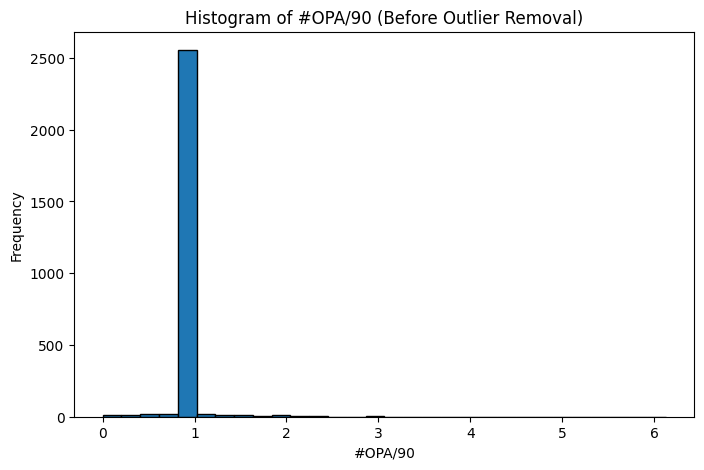

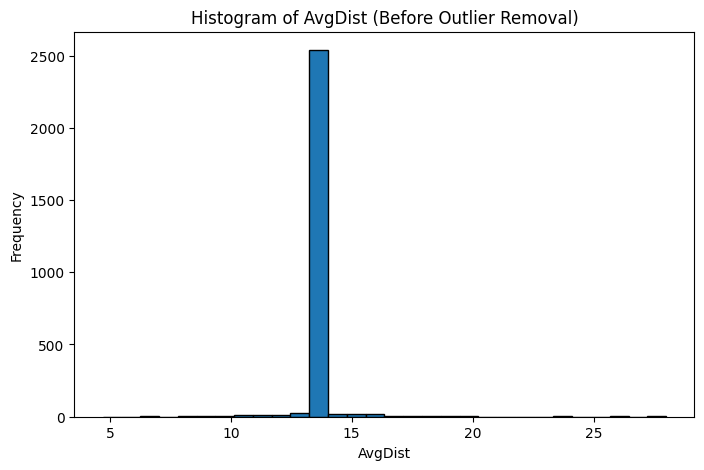

In [ ]:
import matplotlib.pyplot as plt

# Loop through each numerical column and plot a separate histogram
for column in df_numerical_imputed.columns:
    plt.figure(figsize=(8, 5))
    plt.hist(df_numerical_imputed[column], bins=30, edgecolor='k')
    plt.title(f"Histogram of {column} (Before Outlier Removal)")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()


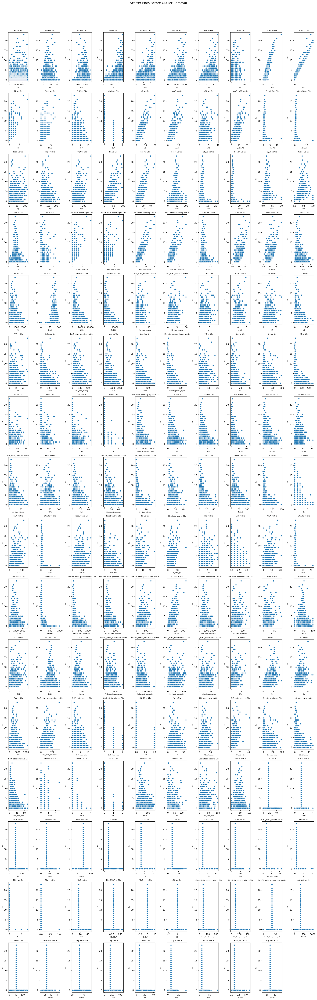

In [ ]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

# Exclude the target variable "Gls" from independent features
scatter_columns = [col for col in df_numerical_imputed.columns if col != "Gls"]

# Determine grid dimensions: 10 plots per row
n_cols = 10
n_rows = math.ceil(len(scatter_columns) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes = axes.flatten()

for idx, col in enumerate(scatter_columns):
    sns.scatterplot(x=df_numerical_imputed[col], y=df_numerical_imputed["Gls"], ax=axes[idx])
    axes[idx].set_title(f"{col} vs Gls", fontsize=8)
    axes[idx].set_xlabel(col, fontsize=6)
    axes[idx].set_ylabel("Gls", fontsize=6)

# Remove any unused axes
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Scatter Plots Before Outlier Removal", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
# Detect and remove outliers using Z-score method (Threshold: 3)
z_scores = np.abs(stats.zscore(df_numerical_imputed))
df_numerical_no_outliers = df_numerical_imputed[(z_scores < 3).all(axis=1)]


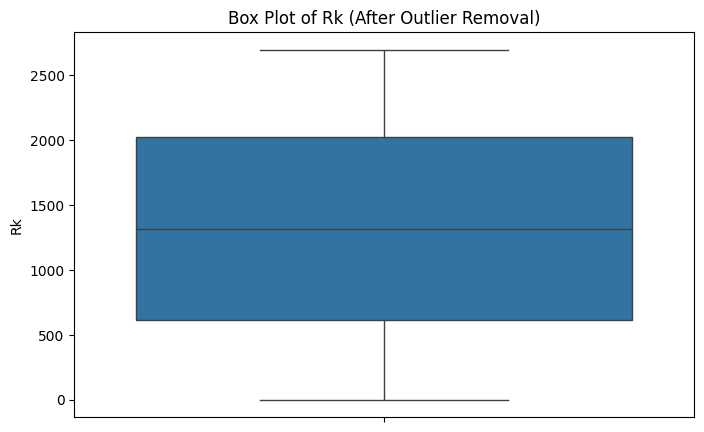

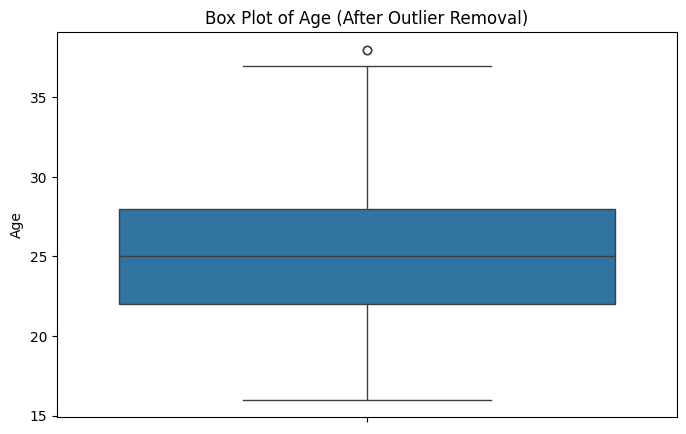

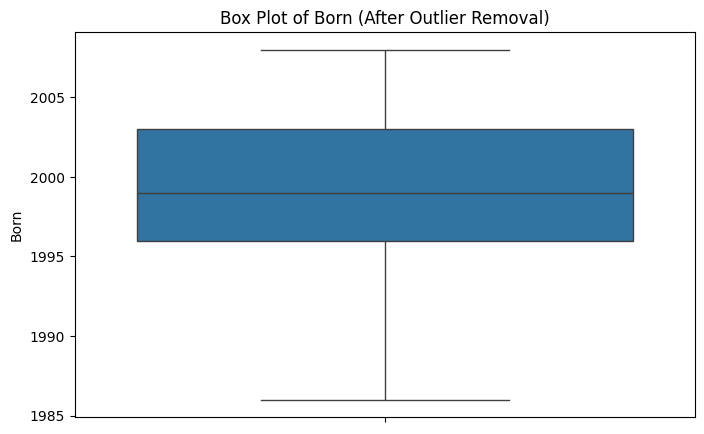

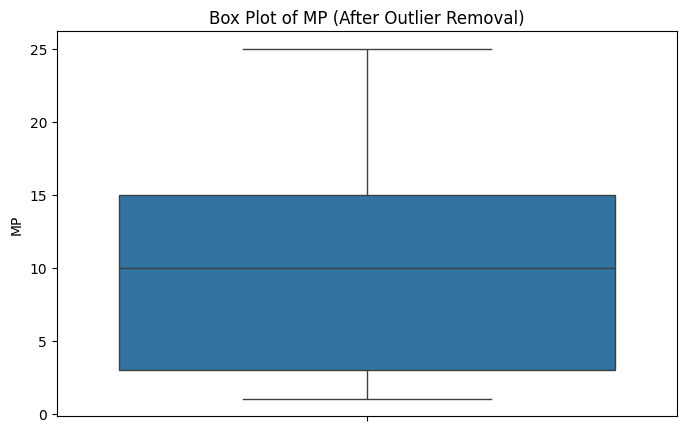

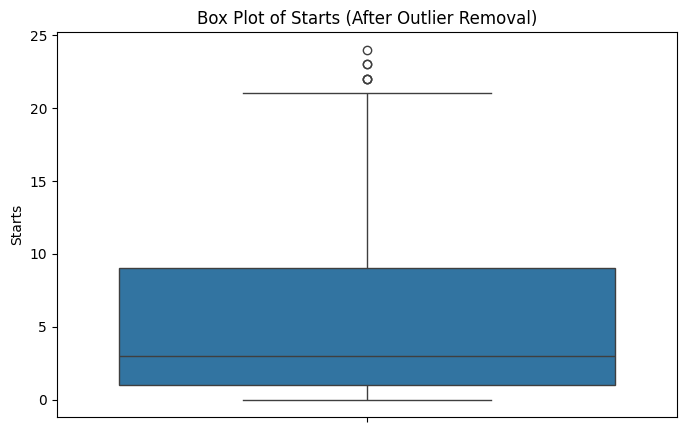

...

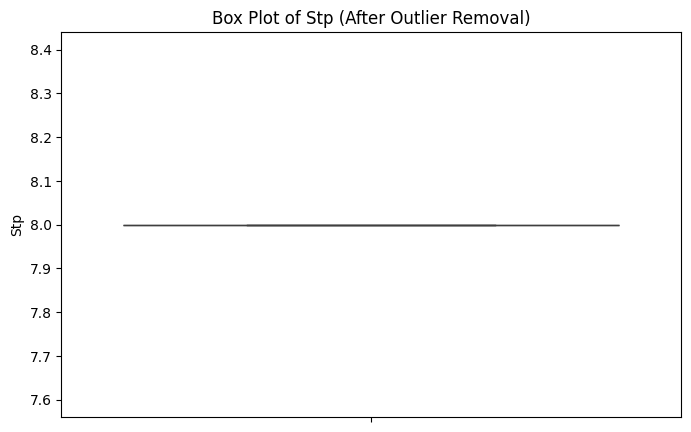

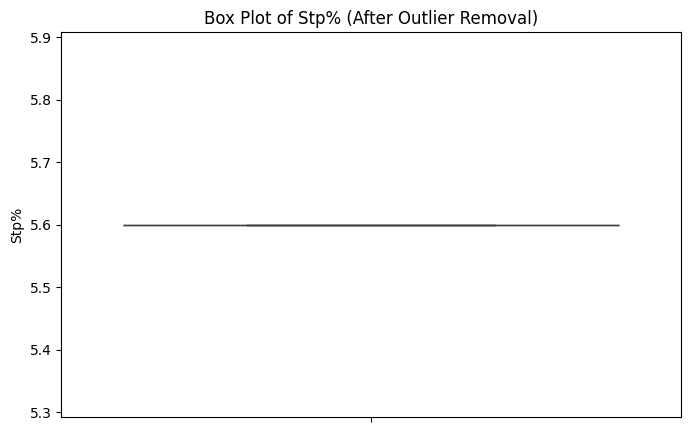

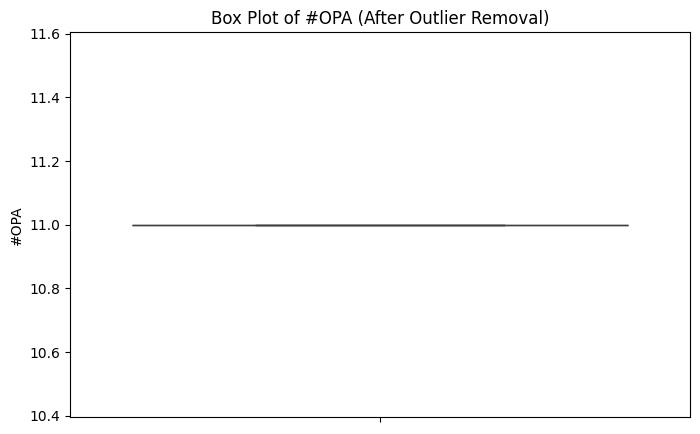

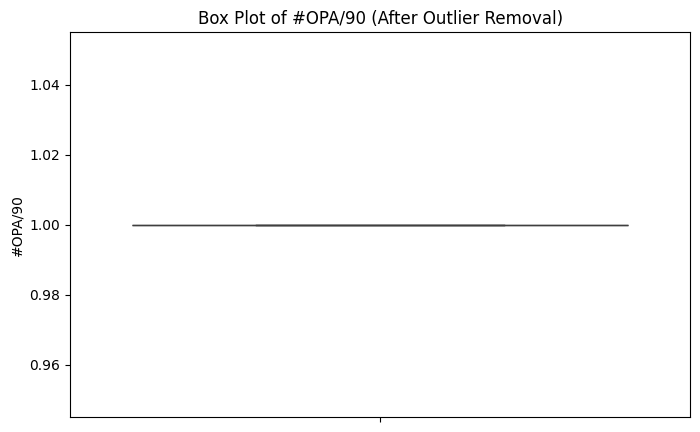

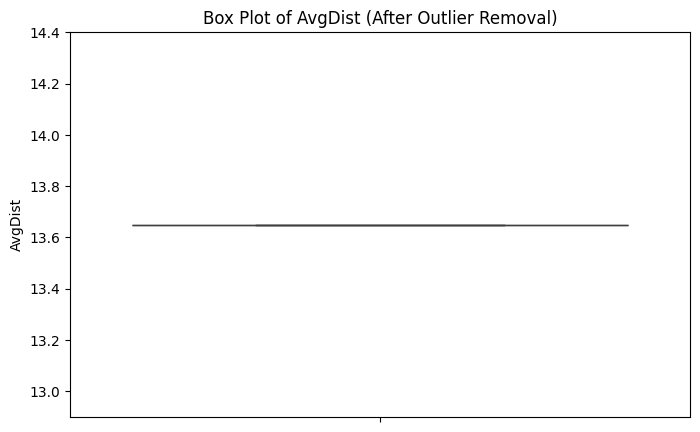

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through each numerical column and plot a separate box plot after outlier removal
for column in df_numerical_no_outliers.columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(y=df_numerical_no_outliers[column])
    plt.title(f"Box Plot of {column} (After Outlier Removal)")
    plt.show()


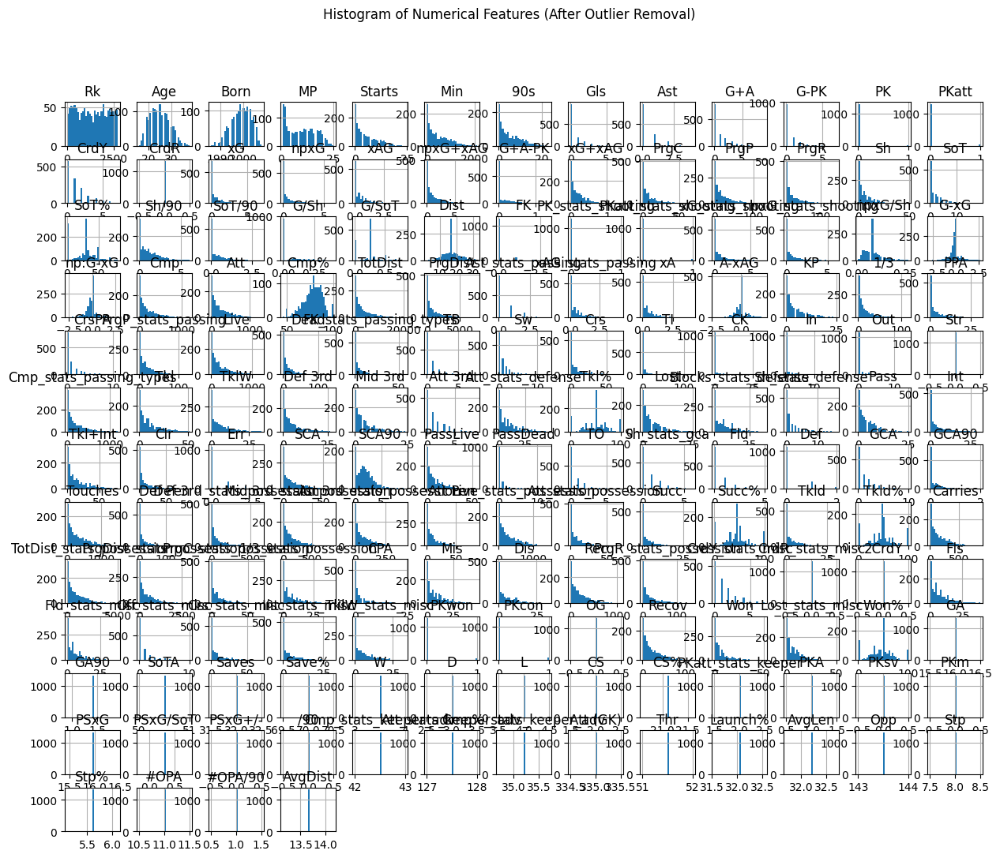

In [ ]:

df_numerical_no_outliers.hist(figsize=(15, 12), bins=30)
plt.suptitle("Histogram of Numerical Features (After Outlier Removal)")
plt.show()


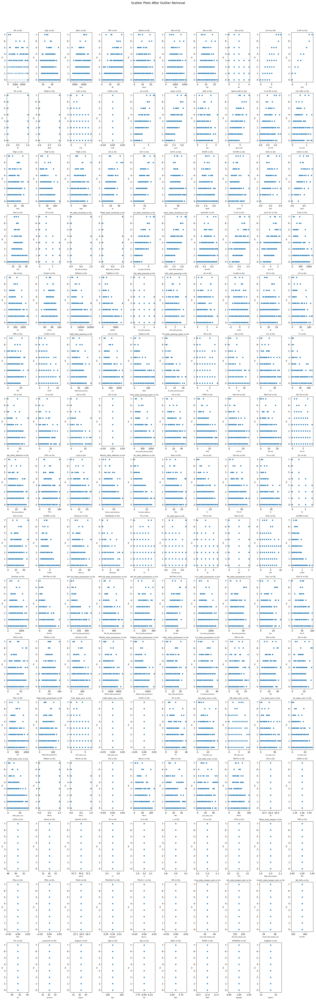

In [ ]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

# Exclude the target variable "Gls" from independent features
scatter_columns_after = [col for col in df_numerical_no_outliers.columns if col != "Gls"]

# Determine grid dimensions: 10 plots per row
n_cols = 10
n_rows = math.ceil(len(scatter_columns_after) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes = axes.flatten()

for idx, col in enumerate(scatter_columns_after):
    sns.scatterplot(x=df_numerical_no_outliers[col], y=df_numerical_no_outliers["Gls"], ax=axes[idx])
    axes[idx].set_title(f"{col} vs Gls", fontsize=8)
    axes[idx].set_xlabel(col, fontsize=6)
    axes[idx].set_ylabel("Gls", fontsize=6)

# Remove any unused axes
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Scatter Plots After Outlier Removal", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
# Define features and target
target_col = "Gls"  # Assuming 'Gls' (Goals) is the target variable
df_numerical_no_outliers = df_numerical_no_outliers.dropna(subset=[target_col])  # Ensure target has no missing values
X = df_numerical_no_outliers.drop(columns=[target_col])
y = df_numerical_no_outliers[target_col]

# Standardize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


In [ ]:
# Split dataset into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [ ]:
# Initialize models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Support Vector Regression": SVR(kernel='rbf')  # SVR with RBF kernel
}

# Train and evaluate models
model_results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    score = model.score(X_test, y_test)  # R² score
    model_results[name] = score

print(model_results)


{'Linear Regression': 1.0, 'Random Forest': 0.9987591261116169, 'Support Vector Regression': 0.8787406933951867}


In [ ]:
# Initialize dictionary to store results
model_metrics = {}

# Evaluate each model
for name, model in models.items():
    y_pred = model.predict(X_test)

    metrics = {
        "MAE": mean_absolute_error(y_test, y_pred),
        "MSE": mean_squared_error(y_test, y_pred),
        "R² Score": r2_score(y_test, y_pred)
    }

    model_metrics[name] = metrics

# Display model performance
for model_name, scores in model_metrics.items():
    print(f"Model: {model_name}")
    for metric, value in scores.items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 40)


Model: Linear Regression
  MAE: 0.0000
  MSE: 0.0000
  R² Score: 1.0000
----------------------------------------
Model: Random Forest
  MAE: 0.0035
  MSE: 0.0013
  R² Score: 0.9988
----------------------------------------
Model: Support Vector Regression
  MAE: 0.1361
  MSE: 0.1224
  R² Score: 0.8787
----------------------------------------


In [ ]:
# Calculate Skewness and Kurtosis for each numerical column
skewness_values = df_numerical_imputed.apply(skew)
kurtosis_values = df_numerical_imputed.apply(kurtosis)

# Print top 10 most skewed and most kurtotic features
print("Top 10 Skewed Features:")
print(skewness_values.sort_values(ascending=False).head(10))

print("\nTop 10 Kurtotic Features:")
print(kurtosis_values.sort_values(ascending=False).head(10))


Top 10 Skewed Features:
GCA90      23.138282
xG+xAG     19.054464
PKm        15.565244
SCA90      13.767496
G+A-PK     13.601858
SoT/90     13.036872
Str        11.732065
#OPA/90    10.435510
PKsv        9.758622
#OPA        8.639073
dtype: float64

Top 10 Kurtotic Features:
GCA90      765.101254
xG+xAG     641.111159
SCA90      354.809871
G+A-PK     348.116687
SoT/90     257.682510
PKm        240.276821
Stp%       194.439162
#OPA/90    188.990279
Str        174.137266
/90        147.968995
dtype: float64


Model R² Scores: {'Linear Regression': 1.0, 'Random Forest': 0.9987591261116169, 'Support Vector Regression': 0.8787406933951867}


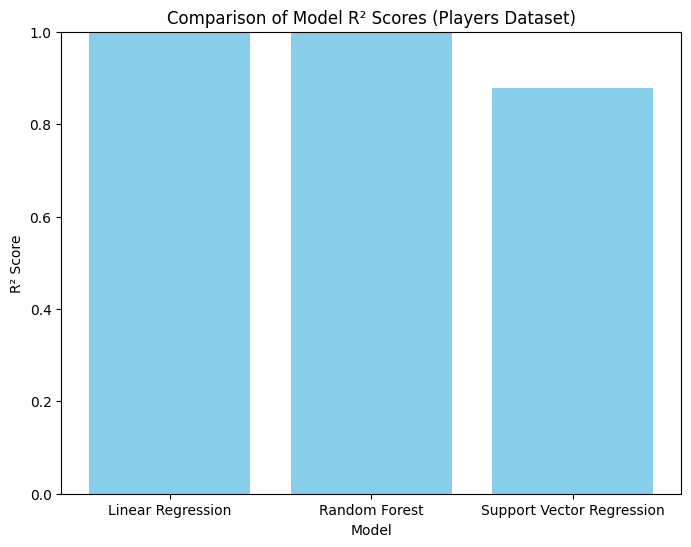

In [ ]:
import matplotlib.pyplot as plt

# Initialize models
models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42),
    "Support Vector Regression": SVR(kernel='rbf')  # SVR with RBF kernel
}

# Train and evaluate models, storing the R² score for each
model_results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    score = model.score(X_test, y_test)  # R² score
    model_results[name] = score

print("Model R² Scores:", model_results)

# Plot a bar graph to compare the R² scores
plt.figure(figsize=(8, 6))
plt.bar(model_results.keys(), model_results.values(), color='skyblue')
plt.ylim(0, 1)
plt.xlabel("Model")
plt.ylabel("R² Score")
plt.title("Comparison of Model R² Scores (Players Dataset)")
plt.show()
